In [1]:
import sys
# print(sys.path)
sys.path.append("..")
# print(sys.path)

In [2]:
# Magic for loading edited .py files 
%load_ext autoreload
%autoreload 2

In [3]:
%reload_ext autoreload

In [4]:
import numpy as np
import torch
import torch.nn as nn
from torch.nn import init 
from torch.nn import functional as F 
import math
import argparse
import random
import os
import time
import gym
import neurogym as ngym
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from neurogym.wrappers import ScheduleEnvs
from neurogym.wrappers.block import MultiEnvs
from neurogym.utils.scheduler import RandomSchedule
from neurogym.envs.collections.modcog import * 
from neurogym.envs.collections import modcog
from training.analysis import get_act_act_variances, get_activity, get_performance, get_activity_list, activity_all_list, activity_by_module
from training.rnn import EI_CTRNN, RNNNet
from training.synaptic_constraints import hsc_thresh, hsc_update, sheet_dist, dist_cost_update
from training.masks import mask2d, smallworldmask
from modularity.girvan_newman import girvan_newman, spectral_modularity, sort_by_cluster, merge_dicts, plot_assoc, Q_star_act_act_cor, Q_star_wTw

import warnings
warnings.filterwarnings('ignore')

/Users/alexnegron/opt/anaconda3/envs/torch-gpu/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Training networks with heterosynaptic competition

RNNNet(
  (rnn): EI_CTRNN(
    (input2h): Linear(in_features=53, out_features=400, bias=True)
    (h2h): Linear(in_features=400, out_features=400, bias=True)
  )
  (fc): Linear(in_features=400, out_features=17, bias=True)
)
Initial weight matrix:


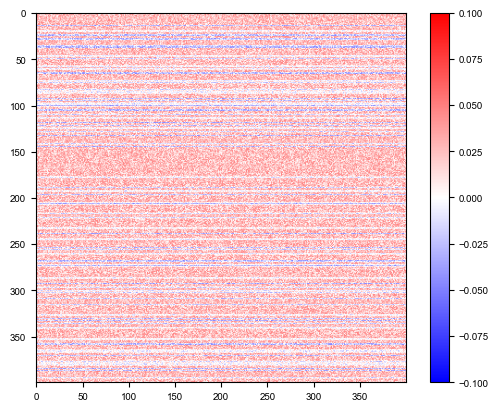

KeyboardInterrupt: 

In [5]:
# RNN training params
hidden_size=20**2
train_steps=20_000
batch_size = 4
lr = 1e-3

# Mask params 
N_x = int(np.sqrt(hidden_size))
N_y = int(np.sqrt(hidden_size))
mask = False
small_world = False
cutoff_local = False 
cutoff_large = False 
d = False
periodic = False

# Heterosynaptic competition params 
hsc_rule=True
ei_ratio=0.8
W_max_E = w_max  = 1 
W_max_I = W_max_E*(1-ei_ratio)
epsilon=.1
eta = lr*1e2
l1 = 1  # hsc loss regularization param

# Long-range wiring cost params
lrwc = False 
d_thresh = 3  # supposed to be ~ smallworld with local=3 
delta = 0.00008


torch.set_default_tensor_type(torch.DoubleTensor)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

envs = [go(), anti(), rtgo(), rtanti(), dlygo(), dlyanti(), dm1(), dm2(), ctxdm1(), ctxdm2(), multidm(), dlydm1(), dlydm2(), ctxdlydm1(), ctxdlydm2(), multidlydm(), dms(), dnms(), dmc(), dnmc()]
envs_names = [go, anti, rtgo, rtanti, dlygo, dlyanti, dm1, dm2, ctxdm1, ctxdm2, multidm, dlydm1, dlydm2, ctxdlydm1, ctxdlydm2, multidlydm, dms, dnms, dmc, dnmc]
schedule = RandomSchedule(len(envs))
env = ScheduleEnvs(envs, schedule=schedule, env_input=True, delay_rule_input=False)
dataset = ngym.Dataset(env, batch_size=batch_size, seq_len=100)
ob_size = env.observation_space.shape[0]
act_size = env.action_space.n

model = RNNNet(input_size = ob_size, 
                   hidden_size = N_x * N_y,
                   ei_ratio = ei_ratio,
                   output_size = act_size,
                   dt = env.dt,
                   mask = None
                   )
model = model.to(device)
print(model)

print('Initial weight matrix:')
plt.imshow(model.rnn.h2h.weight.data.detach().cpu().numpy(), cmap = "bwr", vmin = -0.1, vmax = 0.1)
plt.colorbar()
plt.show()

criterion = nn.CrossEntropyLoss() 
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

print_step = 200
running_loss = 0.0 
running_task_time = 0
running_train_time = 0

perfs = []
losses = []
act_act_modularity_scores = []
weights_modularity_scores = []
torch.set_default_tensor_type(torch.DoubleTensor)

if mask: 
    if small_world: 
        mask2d_n = torch.from_numpy(smallworldmask(N_x,N_y,cutoff_local,cutoff_large,periodic))
        mask2d_n = mask2d_n.double()
    else:
        mask2d_n = torch.from_numpy(mask2d(N_x,N_y,d,periodic))
        mask2d_n = mask2d_n.double() 
else:
    mask2d_n = torch.ones(N_x*N_y, N_x*N_y) # equivalent to there being no mask at all 
    mask2d_n = mask2d_n.double()
    
for i in range(train_steps):
    task_time_start = time.time()
    inputs, labels = dataset()
    running_task_time += time.time() - task_time_start
    inputs = torch.from_numpy(inputs).type(torch.double).to(device)
    labels = torch.from_numpy(labels.flatten()).type(torch.long).to(device)

    train_time_start = time.time()
    optimizer.zero_grad()

    # forward + backward + optimize
    outputs, _ = model(inputs)
    loss = criterion(outputs.view(-1, act_size), labels)

    # Heterosynaptic competition regularization 
#     if hsc_rule == True:
#         # v1 
#         ones = torch.ones(model.rnn.h2h.weight.data.shape[0], model.rnn.h2h.weight.data.shape[1])
#         hsc_reg = l1*(torch.sum(relu(torch.sum(torch.abs(model.rnn.h2h.weight.data), axis=0) - W_max)) + torch.sum(relu(torch.sum(torch.abs(model.rnn.h2h.weight.data), axis=1) - W_max))
#                      + torch.sum(relu(torch.abs(model.rnn.h2h.weight.data) - w_max*ones)))
#         loss = criterion(outputs.view(-1, act_size), labels) + hsc_reg
        
#         # v2 
#         W = torch.abs(model.rnn.h2h.weight.data)
#         ones = torch.ones(W.shape[0], 1)
#         out_pen = relu(ones.T@W - W_max*ones.T)@ones 
#         in_pen = ones.T@relu(W@ones - W_max*ones)
#         upper = ones.T@relu(W - w_max*ones@ones.T)@ones
#         hsc_reg = out_pen**2 + in_pen**2 + upper**2
#         loss = (1-l1)*criterion(outputs.view(-1, act_size), labels) + l1*hsc_reg
        
    loss.backward()
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
    optimizer.step()

    # Heterosynaptic competition 
    if hsc_rule:
        hidden_sgns = model.rnn.hidden_sgns
        e_neurons = (hidden_sgns == 1).nonzero().squeeze()
        i_neurons = (hidden_sgns == -1).nonzero().squeeze()
        model.rnn.h2h.weight.data[e_neurons,:], model.rnn.h2h.weight.data[i_neurons,:] = hsc_update(model, ei_ratio, W_max_E, W_max_I, w_max, epsilon, eta)
    
    # Long-range wiring cost penalty
    if lrwc: 
        hidden_sgns = model.rnn.hidden_sgns
        e_neurons = (hidden_sgns == 1).nonzero().squeeze()
        i_neurons = (hidden_sgns == -1).nonzero().squeeze()
        model.rnn.h2h.weight.data[e_neurons,:], model.rnn.h2h.weight.data[i_neurons,:] = dist_cost_update(model, N_x, N_y, d_thresh, delta)
    
    # Anatomical mask 
    if mask: 
        model.rnn.h2h.weight.data = model.rnn.h2h.weight.data*(mask2d_n.to(device))

    running_train_time += time.time() - train_time_start

     # print statistics
    running_loss += loss.item()
    if i % print_step == (print_step - 1):
        print('{:d} loss: {:0.5f}'.format(i + 1, running_loss / print_step))
        losses.append(running_loss/print_step)

        if True:
            print('Task/Train time {:0.1f}/{:0.1f} ms/step'.format(
                    running_task_time / print_step * 1e3,
                    running_train_time / print_step * 1e3))
            running_task_time, running_train_time = 0, 0

        # compute performance over full task set 
        perf = get_performance(model, env, num_trial=200, device=device)
        perfs.append(perf)
        running_loss = 0.0
        print('{:d} perf: {:0.2f}'.format(i + 1, perf))

        # Compute Q modularity scores
        # Q_act_act, isrt_act_act, p_act_act, adj_var = Q_star_act_act_cor(model, N_x, envs, env, device, num_trial=100)
        Q_wTw, isrt_wTw, p_wTw, wTw = Q_star_wTw(model)
        p_wTw = p_wTw.cpu()
        wTw = wTw.cpu()
        # act_act_modularity_scores.append(Q_act_act)
        weights_modularity_scores.append(Q_wTw)
        # print(f'Activity correlations modularity: {Q_act_act:0.4f}')
        print(f'Weight correlations modularity: {Q_wTw:0.4f}')

        #fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (10,10), tight_layout=True)
        fig, (ax1, ax3) = plt.subplots(1, 2, figsize = (10,10), tight_layout=True)

        
        im = ax1.imshow(model.rnn.h2h.weight.data.detach().cpu().numpy(), cmap = "bwr", vmin = -0.1, vmax = 0.1)
        divider = make_axes_locatable(ax1)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        #plot_assoc(adj_var[isrt_act_act,:][:,isrt_act_act], lines_at=p_act_act.sum(0), line_args={'linewidth' : 1, 'color':'magenta'}, colorbar=True, ax=ax2)
        plot_assoc(wTw[isrt_wTw,:][:,isrt_wTw], lines_at=p_wTw.sum(0), line_args={'linewidth' : 1, 'color':'magenta'}, vmin=0.0, vmax=.1, colorbar=True, ax=ax3, cmap="Reds")
        
        ax1.set_title('weight matrix')
        #ax2.set_title(f'activity correlations \n modularity score: {Q_act_act:.4f}')
        ax3.set_title(f'weight correlations \n modularity score: {Q_wTw:.4f}')
        plt.show()

print('Finished training')

# Neural activity

In [6]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

tasks = [go(), anti(), rtgo(), rtanti(), dlygo(), dlyanti(), dm1(), dm2(), ctxdm1(), ctxdm2(), multidm(), dlydm1(), dlydm2(), ctxdlydm1(), ctxdlydm2(), multidlydm(), dms(), dnms(), dmc(), dnmc()]
schedule = SequentialSchedule(len(tasks)) # must use SequentialSchedule for activity_list() 
env = ScheduleEnvs(tasks, schedule=schedule, env_input=True, delay_rule_input=False)
ob_size = env.observation_space.shape[0]
act_size = env.action_space.n

N_x = N_y = 20
cutoff_local = cutoff_large = 3 
periodic = False 
mask2d_n = torch.from_numpy(smallworldmask(N_x,N_y,cutoff_local,cutoff_large,periodic)).double()
ei_ratio = .8

net = RNNNet(input_size = ob_size, 
                   hidden_size = N_x * N_y,
                   ei_ratio = ei_ratio,
                   output_size = act_size,
                   dt = env.dt,
                   mask = mask2d_n
                   )

net.load_state_dict(torch.load(f'/Users/alexnegron/cogtasks_rnn_modularity/trained_models/RNN_hsize=400_SmallWorldMask_local=3_large=3_HSC_Wmax=1_epsilon=0.1_EIratio=0.8_LR=0.001_Tasks=yang20_RunID=1.pt', map_location=torch.device(device)))

<All keys matched successfully>

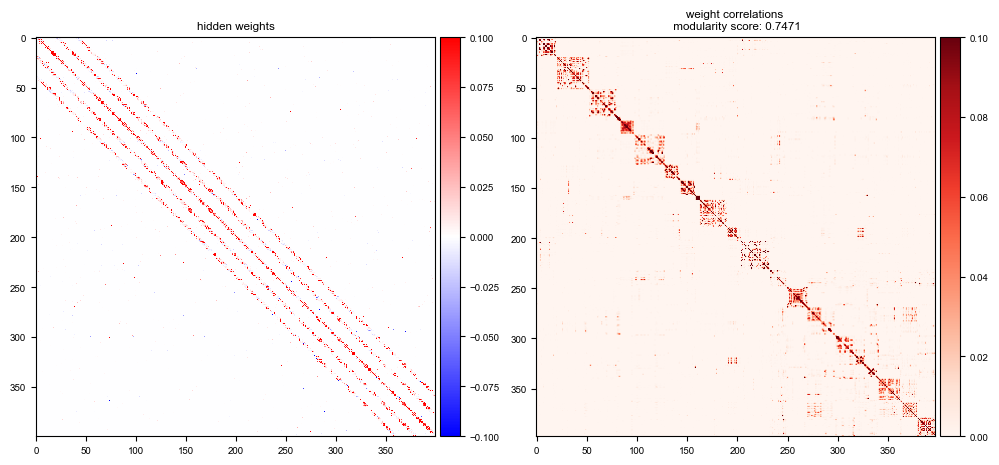

In [7]:
w = net.rnn.h2h.weight.data.detach().cpu().numpy()
Q_wTw, isrt_wTw, p_wTw, wTw = Q_star_wTw(net)
p_wTw = p_wTw.cpu()
wTw = wTw.cpu()


fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10,10), tight_layout=True)
im = ax1.imshow(w, cmap = "bwr", vmin = -0.1, vmax = 0.1)
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax)
# plot_assoc(wTw[isrt_wTw,:][:,isrt_wTw], lines_at=p_wTw.sum(0), line_args={'linewidth' : 1, 'color':'magenta'}, vmin=0.0, vmax=.1, colorbar=True, ax=ax2, cmap="Reds")
plot_assoc(wTw[isrt_wTw,:][:,isrt_wTw], vmin=0.0, vmax=.1, colorbar=True, ax=ax2, cmap="Reds")
ax1.set_title(f'hidden weights')
ax2.set_title(f'weight correlations \n modularity score: {Q_wTw:.4f}')
plt.savefig('/Users/alexnegron/cogtasks_rnn_modularity/figs/weights1.pdf', bbox_inches='tight', transparent=True)
plt.show()

In [20]:
tasks = [go(), anti(), rtgo(), rtanti(), dlygo(), dlyanti(), dm1(), dm2(), ctxdm1(), ctxdm2(), multidm(), dlydm1(), dlydm2(), ctxdlydm1(), ctxdlydm2(), multidlydm(), dms(), dnms(), dmc(), dnmc()]
schedule = SequentialSchedule(len(tasks)) # must use SequentialSchedule for get_activity_list() 
env = ScheduleEnvs(tasks, schedule=schedule, env_input=True, delay_rule_input=False)
#activity_list, activity_per_period_list = activity_list(net, tasks, env, device, num_trial=100)
activity_list_by_module, activity_per_period_list_by_module = activity_by_module(net, tasks, env, device, p_wTw, num_trial=300)

Notes how to access these objects: 
- `activity_per_period_list_by_module[m][1]` returns the indices of the neurons in module `m`
- `activity_per_period_list_by_module[m][0][i]` is a dictionary for the i-th trial, where each key is the name of a task
- `activity_per_period_list_by_module[m][0][i][task]` is a dictionary where each key is the name of a period belonging to the selected `task`
- `activity_per_period_list_by_module[m][0][i][task][period]` is the activity array itself; note the activity recorded here are of the neurons only in module `m`. This array has shape `(# timesteps in period, 1, # neurons in module m)`

## Module activity over time

In [9]:
from matplotlib import animation
from IPython.display import HTML
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.ndimage.filters import gaussian_filter1d
from matplotlib.lines import Line2D
import matplotlib.gridspec as grd
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns 

In [10]:
def module_act_at_t(mat, P, t_i, isrt, activity_list_by_module, task_name, period, line_args):
    num_trials = len(activity_list_by_module[0][0])
    
    mod_bdrys = p_wTw.sum(0)[p_wTw.sum(0).nonzero()].detach().cpu().numpy().astype(int)
    isrt_arr = isrt.detach().cpu().numpy()

    list_avg_act_module = []
    for which_mod in range(len(mod_bdrys)):
        avg_act_module = np.mean(np.array([activity_list_by_module[which_mod][0][i][task_name].squeeze(axis=1) for i in range(num_trials)]), axis=0)
        list_avg_act_module.append(avg_act_module)
    avg_acts_by_module = np.hstack(list_avg_act_module)

    t_idxs = np.arange(avg_acts_by_module.shape[0])
    
    ax1 = plt.subplot(gs[2])
    p1 = ax1.imshow(mat[isrt_arr,:][:,isrt_arr], vmin=0.0, vmax=.1, cmap="Reds", aspect='auto')
    
            
    # color bar in it's own axis
    colorAx1 = plt.subplot(gs[3])
    cb1 = plt.colorbar(p1, cax = colorAx1)
    ax1.set_xticks([], []) 
    ax1.set_yticks([], []) 

    ax2 = plt.subplot(gs[0])
    ax2.xaxis.set_ticks_position('bottom')
    ax2.yaxis.set_ticks_position('left')
    p2 = ax2.imshow(np.vstack([avg_acts_by_module[t_idxs[t_i], :]]*t_idxs.shape[0]), vmin=0., vmax=1., aspect='auto', cmap="binary")
    
    
    sz = len(mat)
    sz2 = len(avg_acts_by_module)
    line_args = merge_dicts({'color': 'r', 'linewidth':0.5}, line_args)
    for x in np.cumsum(P.sum(0))-0.5:
        #ax1.plot([-.5, sz-.5], [x, x], **line_args)
        ax1.plot([x, x], [-.5, sz-.5], **line_args)
        #ax2.plot([-.5, sz-.5], [x, x], **line_args)
        ax2.plot([x, x], [-.5, sz2-.5], **line_args)
    
    
    colorAx2 = plt.subplot(gs[1])
    cb2 = plt.colorbar(p2, cax = colorAx2)
    ax2.set_xticks([], []) 
    ax2.set_yticks([], [])
    ax2.text(0, 32, 't = {:.2f}'.format(int(t_idxs[t_i]+1)*100), fontdict={'fontsize':14})

     
    #plt.show()

In [58]:
avg_act_module = np.mean(np.array([activity_list_by_module[0][0][i]['ctxdm1'].squeeze(axis=1) for i in range(100)]), axis=0)


CalledProcessError: Command '['/Users/alexnegron/opt/anaconda3/bin/ffmpeg', '-f', 'rawvideo', '-vcodec', 'rawvideo', '-s', '1000x500', '-pix_fmt', 'rgba', '-r', '5', '-loglevel', 'error', '-i', 'pipe:', '-vcodec', 'h264', '-pix_fmt', 'yuv420p', '-y', '/Users/alexnegron/cogtasks_rnn_modularity/figs/module_act_over_time_task=multidlydm.mp4']' returned non-zero exit status 255.

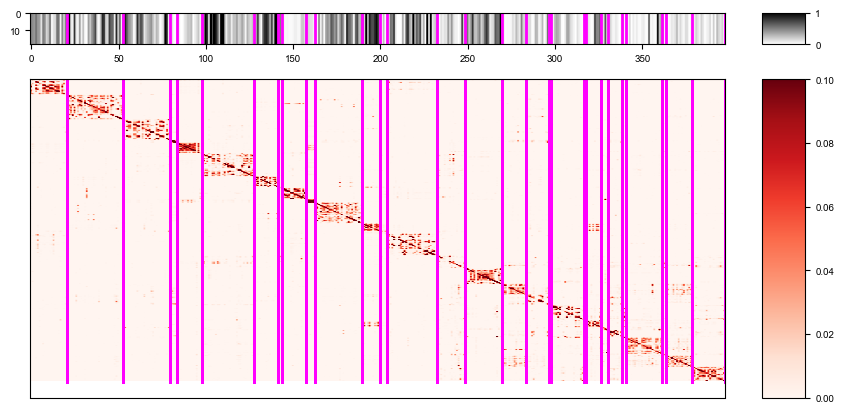

In [11]:
gs = grd.GridSpec(2, 2, height_ratios=[1,10], width_ratios=[16,1], wspace=0.1)
fig = plt.figure(figsize=(10,5))
ax1 = plt.subplot(gs[2])
ax2 = plt.subplot(gs[0])

def animate(i):
 
    ax2.clear()
    
    t_i = i
    isrt=isrt_wTw
    P=p_wTw
    mat=wTw
    task_name='multidlydm'
    # period='stimulus'
    line_args={'linewidth' : 2, 'color':'magenta'}
    
    num_trials = len(activity_list_by_module[0][0])
    
    mod_bdrys = p_wTw.sum(0)[p_wTw.sum(0).nonzero()].detach().cpu().numpy().astype(int)
    isrt_arr = isrt.detach().cpu().numpy()

    list_avg_act_module = []
    for which_mod in range(len(mod_bdrys)):
        avg_act_module = np.mean(np.array([activity_list_by_module[which_mod][0][i][task_name].squeeze(axis=1) for i in range(num_trials)]), axis=0)
        list_avg_act_module.append(avg_act_module)
    avg_acts_by_module = np.hstack(list_avg_act_module)

    t_idxs = np.arange(avg_acts_by_module.shape[0])
    #print(t_idxs.shape)
    
    # create a 2 X 2 grid 
    
    p1 = ax1.imshow(mat[isrt_arr,:][:,isrt_arr], vmin=0.0, vmax=.1, cmap="Reds", aspect='auto')
    
    
            
    # color bar in it's own axis
    colorAx1 = plt.subplot(gs[3])
    cb1 = plt.colorbar(p1, cax = colorAx1)
    ax1.set_xticks([], []) 
    ax1.set_yticks([], []) 

    
    ax2.xaxis.set_ticks_position('bottom')
    ax2.yaxis.set_ticks_position('left')
    p2 = ax2.imshow(np.vstack([avg_acts_by_module[t_idxs[t_i], :]]*t_idxs.shape[0]), vmin=0., vmax=1., aspect='auto', cmap="binary")
    
    
    sz = len(mat)
    sz2 = len(avg_acts_by_module)
    line_args = merge_dicts({'color': 'r', 'linewidth':0.5}, line_args)
    for x in np.cumsum(P.sum(0))-0.5:
        #ax1.plot([-.5, sz-.5], [x, x], **line_args)
        ax1.plot([x, x], [-.5, sz-.5], **line_args)
        #ax2.plot([-.5, sz-.5], [x, x], **line_args)
        ax2.plot([x, x], [-.5, sz2-.5], **line_args)
    
    
    colorAx2 = plt.subplot(gs[1])
    cb2 = plt.colorbar(p2, cax = colorAx2)
    ax2.set_xticks([], []) 
    ax2.set_yticks([], [])
    ax2.text(0, 32, 't = {:.2f}'.format(int(t_idxs[t_i]+1)*100), fontdict={'fontsize':14})    
    ax2.set_title(f'task: {task_name}')
        
    return []


anim = animation.FuncAnimation(fig, 
                               animate,
                               frames=20, 
                               interval=500, 
                               blit=True)


task_name = 'multidlydm'
plt.rcParams['animation.ffmpeg_path'] = '/Users/alexnegron/opt/anaconda3/bin/ffmpeg'
FFwriter = animation.FFMpegWriter()
anim.save(f'/Users/alexnegron/cogtasks_rnn_modularity/figs/module_act_over_time_task={task_name}.mp4', writer=FFwriter)
html = HTML(anim.to_jshtml(default_mode='loop'))
display(html)
plt.close()

## Neural activity by module visualizations

In [12]:
module_idxs = np.arange(len(activity_per_period_list_by_module))
module_lens = {'module_'+str(i) : len(activity_per_period_list_by_module[i][1]) for i in module_idxs}
module_lens

{'module_0': 21,
 'module_1': 32,
 'module_2': 27,
 'module_3': 4,
 'module_4': 14,
 'module_5': 30,
 'module_6': 14,
 'module_7': 2,
 'module_8': 14,
 'module_9': 5,
 'module_10': 27,
 'module_11': 10,
 'module_12': 4,
 'module_13': 29,
 'module_14': 16,
 'module_15': 21,
 'module_16': 14,
 'module_17': 13,
 'module_18': 1,
 'module_19': 19,
 'module_20': 1,
 'module_21': 9,
 'module_22': 4,
 'module_23': 8,
 'module_24': 2,
 'module_25': 21,
 'module_26': 2,
 'module_27': 15,
 'module_28': 19}

In [28]:
def plot_pca2_by_modules(task_names, module_idxs, activity_list, num_trial):
    rows = len(task_names)
    cols = len(module_idxs)
    fig, ax = plt.subplots(rows, cols, figsize=(50,70), squeeze=False)
        
    for i in range(len(task_names)):
        task_name = task_names[i]
        activity = []
        for idx in module_idxs:
            activity.append(np.concatenate([activity_list[idx][0][j][task_name].squeeze(axis=1) for j in range(num_trial)]))

        pca2s = [PCA(n_components=2) for _ in range(len(activity))]
        
        for k in range(len(activity)):
            
            pca = pca2s[k].fit(activity[k])
            module_idx = module_idxs[k]
            
            for j in range(num_trial):

                activity_pc2 = pca.transform(activity_list_by_module[module_idx][0][j][task_name].squeeze(axis=1))
                
                
                _ = ax[i,k].plot(activity_pc2[:, 0], activity_pc2[:, 1], alpha=.05, color='black')
                _ = ax[i,k].scatter(activity_pc2[-1, 0], activity_pc2[-1, 1], s=35, marker='>', c='black')
                _ = ax[i,k].scatter(activity_pc2[0, 0], activity_pc2[0, 1], s=35, marker='o', c='black')
                ax[i,k].set_aspect(np.diff(ax[i,k].get_xlim())/np.diff(ax[i,k].get_ylim()))


                ax[i,k].set_title(f'task = {task_name}, mod = {module_idxs[k]}')

        # ax[i,0].set_xlabel('PC 1')
        # ax[i,0].set_ylabel('PC 2')
    plt.tight_layout()
    plt.show() 
    
def style_3d_ax(ax):
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_edgecolor('w')
    ax.yaxis.pane.set_edgecolor('w')
    ax.zaxis.pane.set_edgecolor('w')
    ax.set_xlabel('PC 1')
    ax.set_ylabel('PC 2')
    ax.set_zlabel('PC 3')
    
def plot_pca3_by_modules(task_names, module_idxs, activity_list, num_trial):
    rows = len(task_names)
    cols = len(module_idxs)
    fig, ax = plt.subplots(rows, cols, figsize=(50,70), squeeze=False, subplot_kw=dict(projection='3d'))
        
    for i in range(len(task_names)):
        task_name = task_names[i]
        activity = []
        for idx in module_idxs:
            activity.append(np.concatenate([activity_list[idx][0][j][task_name].squeeze(axis=1) for j in range(num_trial)]))

        pca3s = [PCA(n_components=3) for _ in range(len(activity))]
        
        for k in range(len(activity)):
            
            pca = pca3s[k].fit(activity[k])
            module_idx = module_idxs[k]
            
            for j in range(num_trial):

                activity_pc3 = pca.transform(activity_list_by_module[module_idx][0][j][task_name].squeeze(axis=1))
                
                _ = ax[i,k].plot(activity_pc3[:, 0], activity_pc3[:, 1], activity_pc3[:, 2], alpha=.05, c='black')
                _ = ax[i,k].scatter(activity_pc3[-1, 0], activity_pc3[-1, 1], activity_pc3[-1, 2], s=35, marker='>', c='black')
                _ = ax[i,k].scatter(activity_pc3[0, 0], activity_pc3[0, 1], activity_pc3[0, 2], s=35, marker='o', c='black')
                #ax[i,k].set_aspect(np.diff(ax[i,k].get_xlim())/np.diff(ax[i,k].get_ylim()))
                ax[i,k].set_aspect('equal')


                ax[i,k].set_title(f'task = {task_name}, mod = {module_idxs[k]}')
                style_3d_ax(ax[i,k])
                
        # ax[i,0].set_xlabel('PC 1')
        # ax[i,0].set_ylabel('PC 2')
    
    plt.tight_layout()
    plt.show() 

In [16]:
size_thresh = 15
threshed_module_idxs = []
for i in range(len(module_lens)):
    if module_lens['module_'+str(i)] >= size_thresh: 
        threshed_module_idxs.append(i)
print(threshed_module_idxs)
print(len(threshed_module_idxs))

[0, 1, 2, 5, 10, 13, 14, 15, 19, 25, 27, 28]
12


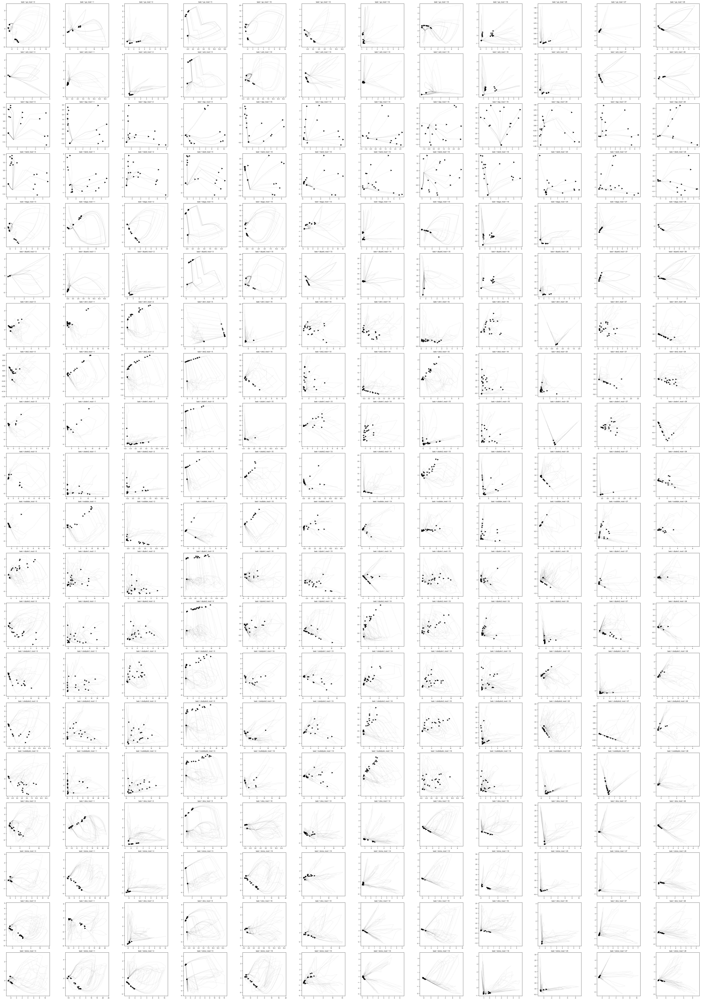

In [17]:
task_names = []
for i in range(len(tasks)):
    env.new_trial()    
    task_names.append(env.task.task_name)
    
plot_pca2_by_modules(task_names, module_idxs=threshed_module_idxs, activity_list = activity_list_by_module, num_trial=20)

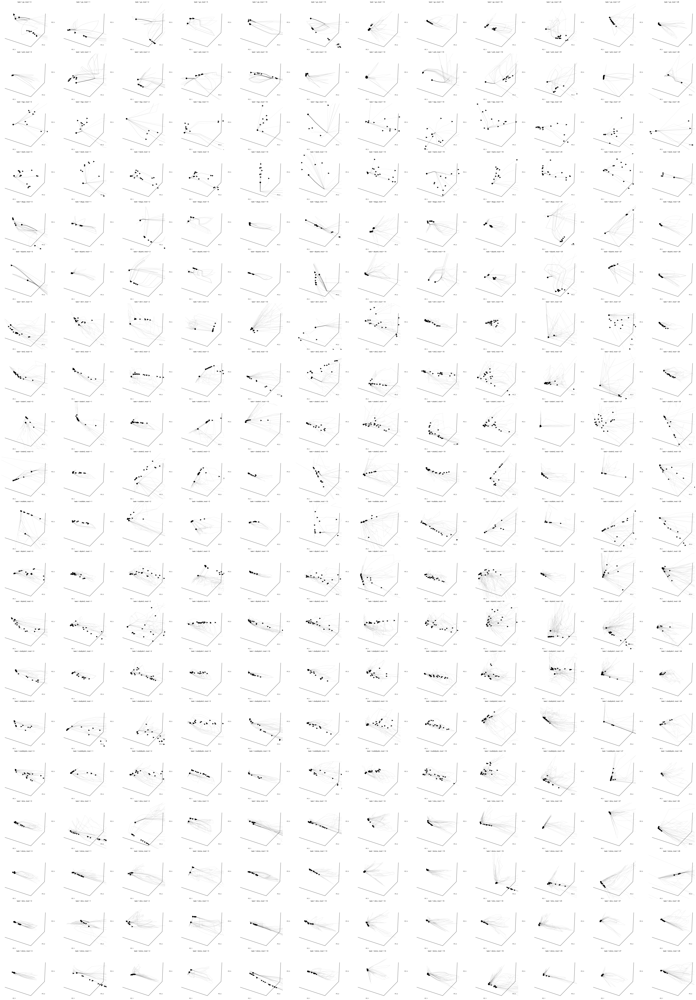

In [29]:
plot_pca3_by_modules(task_names, module_idxs=threshed_module_idxs, activity_list = activity_list_by_module, num_trial=20)

In [89]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

def yang_agglo_clustering(norm_task_variance,min_clusters=2, max_clusters=1000,issymmetric=False):
    X = norm_task_variance.T
    silhouette_scores = []
    
    max_clusters = min(min(X.shape), max_clusters)
    n_clusters = np.arange(min_clusters, max_clusters)
    if len(n_clusters)==0:
        n_clusters = [2]

    

    for n in n_clusters:
        cluster_model = AgglomerativeClustering(n_clusters=n)
        labels = cluster_model.fit_predict(X)
        # print(X.shape)
      # print(labels.shape)
        silhouette_scores.append(silhouette_score(X, labels))

    plt.figure()
    plt.plot(n_clusters, silhouette_scores, 'o-')
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette score')


    n_cluster = n_clusters[np.argmax(silhouette_scores)]
    cluster_model = AgglomerativeClustering(n_clusters=n_cluster)
    labels = cluster_model.fit_predict(X)
    linkage_model = cluster_model.fit(X)
    cluster_labels = np.copy(labels)
  # print(cluster_labels)
  # print(cluster_model.labels_)
  # Sort clusters by its task preference (important for consistency across nets)

    label_prefs = [np.argmax(norm_task_variance[:, labels==l].sum(axis=1)) for l in set(labels)]
    ind_label_sort = np.argsort(label_prefs)
    label_prefs = np.array(label_prefs)[ind_label_sort]

  # Relabel

    labels2 = np.zeros_like(labels)
    for i, ind in enumerate(ind_label_sort):
        labels2[labels==ind] = i
    labels = labels2

  # Sort neurons by labels
    ind_sort = np.argsort(labels)
    labels = labels[ind_sort]
    if issymmetric:
        norm_task_variance = norm_task_variance[ind_sort][:, ind_sort]
    else:
        norm_task_variance = norm_task_variance[:, ind_sort]
    return norm_task_variance,ind_sort,labels,cluster_labels,linkage_model

In [12]:
activity_all_list, activity_per_period_list = activity_all_list(net, tasks, env, device, num_trial=300)

In [109]:
# Compute and plot task variances
task_variance_list = list()
activity_list_all_tasks = {}
num_trial = 300 

for task_name in list(activity_all_list[0].keys()):
    print(task_name)
    # env.set_i(i)
    # activity_list, trial_list, perf = get_activity(net, env, num_trial=1000, device=device)
    
    activity_list = activity_list_all_tasks[task_name] = [activity_all_list[i][task_name] for i in range(num_trial)]
    
    len_activities = [activity_all_list[i][task_name].squeeze(axis=1).shape[0] for i in range(num_trial)]
    # print(len_activities)
    min_length = min(len_activities)
    max_length = max(len_activities) 
    len_activities_values = np.bincount(len_activities).nonzero()[0]
    # print(len_activities_values)
    num_len_activities_values = len_activities_values.shape[0]
    # print(num_len_activities_values)
    
#     # Compute task variances 
    # task_variances = np.zeros((num_len_activities_values, ))
    task_variances = []
    for idx, iter_len in enumerate(len_activities_values):
        which_activities = np.where(np.array(len_activities)==iter_len)[0]
        
        activities_of_fixed_len = [activity_list[x] for x in which_activities]
        activities_of_fixed_len = np.concatenate(activities_of_fixed_len,axis=1) #shape task_len,num_trials,N
        avg_activities_of_fixed_len = np.average(activities_of_fixed_len,axis=1)
        
        task_variances.append(np.var(activities_of_fixed_len, axis=1).mean(axis=0))
        
        
    task_variance = np.average(task_variances,axis=0)
    task_variance_list.append(task_variance)    
    
    
    
task_variance = np.array(task_variance_list)  # (n_task, n_units)
# thres = 1e-6
# excluded_nodes = np.where(task_variance.sum(axis=0)<thres)
# task_variance = task_variance[:, task_variance.sum(axis=0)>thres]
norm_task_variance = task_variance / np.max(task_variance, axis=0)

dms
dnms
dmc
dnmc
go
anti
rtgo
rtanti
dlygo
dlyanti
dm1
dm2
ctxdm1
ctxdm2
multidm
dlydm1
dlydm2
ctxdlydm1
ctxdlydm2
multidlydm


In [118]:
thres = 1e-6
excluded_nodes = np.where(task_variance.sum(axis=0)<thres)
task_variance = task_variance[:, task_variance.sum(axis=0)>thres]
norm_task_variance = task_variance / np.max(task_variance, axis=0)

In [119]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE, MDS, LocallyLinearEmbedding
from sklearn.decomposition import PCA

def yang_agglo_clustering(norm_task_variance, min_clusters=2, issymmetric=False):
  
    X = norm_task_variance.T
    silhouette_scores = list()
    n_clusters = np.arange(min_clusters, min(X.shape))

    for n in n_clusters:
        cluster_model = AgglomerativeClustering(n_clusters=n)
        labels = cluster_model.fit_predict(X)
      # print(X.shape)
      # print(labels.shape)
        silhouette_scores.append(silhouette_score(X, labels))

    plt.figure()
    plt.plot(n_clusters, silhouette_scores, 'o-')
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette score')

    n_cluster = n_clusters[np.argmax(silhouette_scores)]
    cluster_model = AgglomerativeClustering(n_clusters=n_cluster)
    labels = cluster_model.fit_predict(X)
    cluster_labels = np.copy(labels)
    #print(cluster_labels)
    #print(cluster_model.labels_)
    
    # Sort clusters by its task preference (important for consistency across nets)
    label_prefs = [np.argmax(norm_task_variance[:, labels==l].sum(axis=1)) for l in set(labels)]
    ind_label_sort = np.argsort(label_prefs)
    label_prefs = np.array(label_prefs)[ind_label_sort]

    # Relabel
    labels2 = np.zeros_like(labels)
    for i, ind in enumerate(ind_label_sort):
        labels2[labels==ind] = i
    labels = labels2

    # Sort neurons by labels
    ind_sort = np.argsort(labels)
    labels = labels[ind_sort]
    if issymmetric:
        norm_task_variance = norm_task_variance[ind_sort][:, ind_sort]
    else:
        norm_task_variance = norm_task_variance[:, ind_sort]
    return norm_task_variance, ind_sort, labels

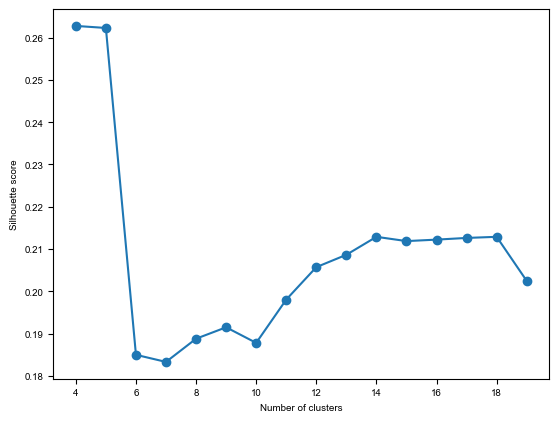

In [137]:
norm_task_variance_ordered, ind_sort, labels = yang_agglo_clustering(norm_task_variance, min_clusters=4)

(0.0, 398.0, -1.0, 1.0)

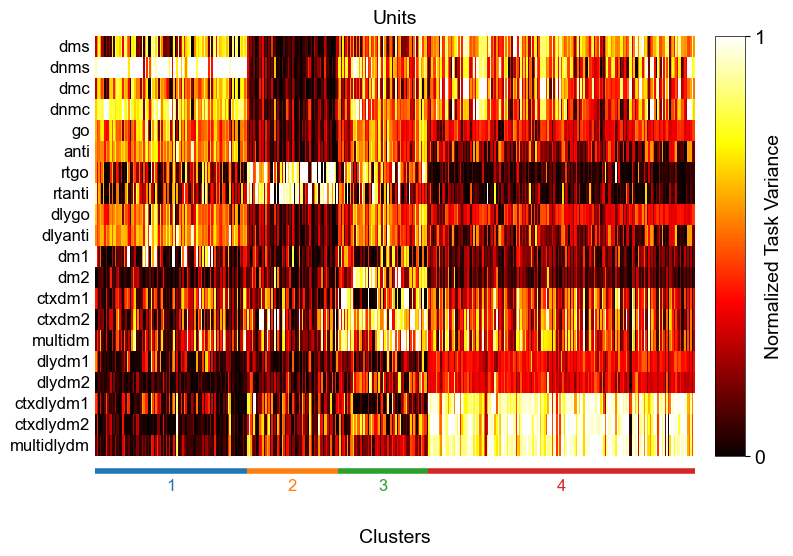

In [138]:
#%matplotlib inline
figsize = (10,6)
rect = [0.25, 0.2, 0.6, 0.7]
rect_color = [0.25, 0.15, 0.6, 0.05]
rect_cb = [0.87, 0.2, 0.03, 0.7]
tick_names = task_names #[task[len('yang19.'):-len('-v0')] for task in tasks]
fs = 12
labelpad = 26*2

vmin, vmax = 0, 1

fig = plt.figure(figsize=figsize)
ax = fig.add_axes(rect)
#cmap = 'magma'
cmap = 'hot' 
im = ax.imshow(norm_task_variance_ordered, cmap=cmap,
               aspect='auto', interpolation='nearest', vmin=vmin, vmax=vmax)

plt.yticks(range(len(tick_names)), tick_names,
           rotation=0, va='center', fontsize=fs)
plt.xticks([])
plt.title('Units', fontsize=14, y=1.01)
plt.xlabel('Clusters', fontsize=14, labelpad=labelpad)
ax.tick_params('both', length=0)

for loc in ['bottom','top','left','right']:
    ax.spines[loc].set_visible(False)

ax = fig.add_axes(rect_cb)
cb = plt.colorbar(im, cax=ax, ticks=[vmin,vmax])
cb.outline.set_linewidth(0.5)
clabel = 'Normalized Task Variance'

cb.set_label(clabel, fontsize=14, labelpad=0)
plt.tick_params(axis='both', which='major', labelsize=14)

# Plot color bars indicating clustering

cmap = plt.cm.get_cmap('tab10')
ax = fig.add_axes(rect_color)
for il, l in enumerate(np.unique(labels)):
    color = cmap(il % 10)
    ind_l = np.where(labels==l)[0][[0, -1]]+np.array([0,1])
    
    ax.plot(ind_l, [0,0], linewidth=4, solid_capstyle='butt',
            color=color)
    ax.text(np.mean(ind_l), -0.5, str(il+1), fontsize=12,
            ha='center', va='top', color=color)

ax.set_xlim([0, len(labels)])
ax.set_ylim([-1, 1])
ax.axis('off')

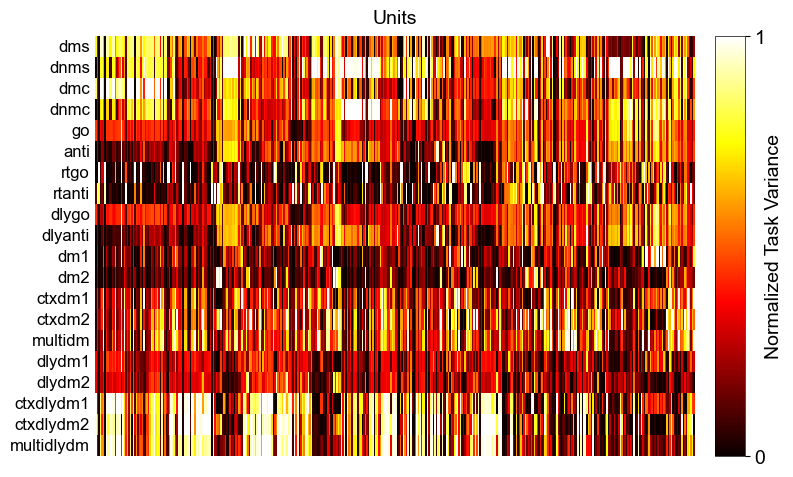

In [113]:
task_names = list(activity_list_all_tasks.keys())
#%matplotlib inline
figsize = (10,6)
rect = [0.25, 0.2, 0.6, 0.7]
rect_color = [0.25, 0.15, 0.6, 0.05]
rect_cb = [0.87, 0.2, 0.03, 0.7]
tick_names = task_names #[task[len('yang19.'):-len('-v0')] for task in tasks]
fs = 12
labelpad = 26*2

vmin, vmax = 0, 1

fig = plt.figure(figsize=figsize)
ax = fig.add_axes(rect)
#cmap = 'magma'
cmap = 'hot' 
norm_task_variance_ordered = norm_task_variance[:, isrt_wTw.detach().cpu().numpy()]
# norm_task_variance_ordered = norm_task_variance

im = ax.imshow(norm_task_variance_ordered, cmap=cmap,
               aspect='auto', interpolation='nearest', vmin=vmin, vmax=vmax)

plt.yticks(range(len(tick_names)), tick_names,
           rotation=0, va='center', fontsize=fs)
plt.xticks([])
plt.title('Units', fontsize=14, y=1.01)
ax.tick_params('both', length=0)

for loc in ['bottom','top','left','right']:
    ax.spines[loc].set_visible(False)

ax = fig.add_axes(rect_cb)
cb = plt.colorbar(im, cax=ax, ticks=[vmin,vmax])
cb.outline.set_linewidth(0.5)
clabel = 'Normalized Task Variance'

cb.set_label(clabel, fontsize=14, labelpad=0)
plt.tick_params(axis='both', which='major', labelsize=14)

In [73]:
perf_per_task = [] 
for i in range(len(tasks)):
    env.set_i(i)
    perf = get_performance(net, env, num_trial=500)
    perf_per_task.append(perf)
    print('Average performance {:0.2f} for task {:s}'.format(perf, task_names[i]))

Average performance 0.87 for task go
Average performance 0.86 for task anti
Average performance 0.88 for task rtgo
Average performance 0.85 for task rtanti
Average performance 0.86 for task dlygo
Average performance 0.85 for task dlyanti
Average performance 0.85 for task dm1
Average performance 0.87 for task dm2
Average performance 0.89 for task ctxdm1
Average performance 0.88 for task ctxdm2
Average performance 0.87 for task multidm
Average performance 0.85 for task dlydm1
Average performance 0.88 for task dlydm2
Average performance 0.84 for task ctxdlydm1
Average performance 0.85 for task ctxdlydm2
Average performance 0.87 for task multidlydm
Average performance 0.85 for task dms
Average performance 0.84 for task dnms
Average performance 0.87 for task dmc
Average performance 0.88 for task dnmc


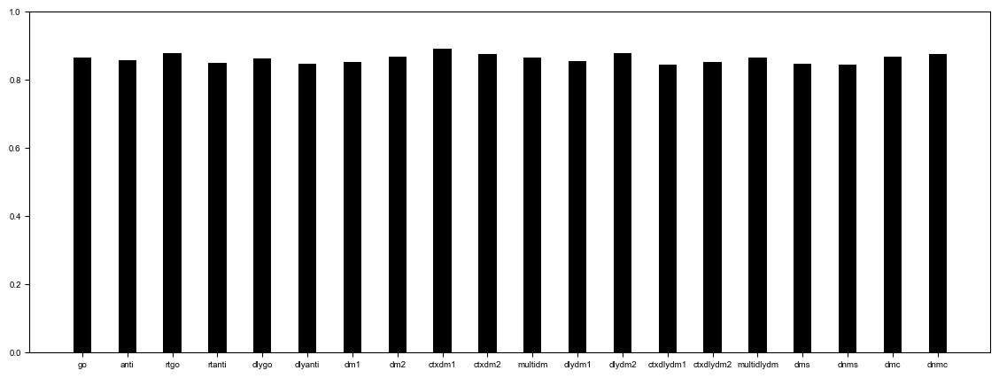

In [75]:
bar_labels, values = zip((task_names, perf_per_task))
fig, ax = plt.subplots(figsize=(14,5))
ax.bar(bar_labels[0], values[0], width=.4, align='center', color='black')
ax.set_ylim(0,1)
plt.show()

# Infomap clustering 

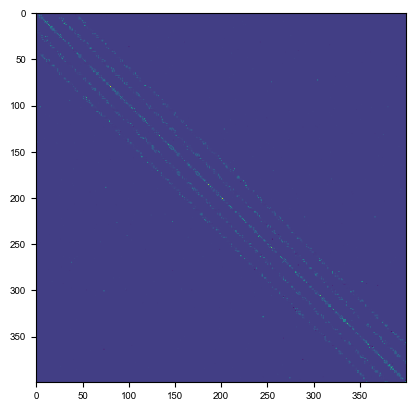

In [8]:
plt.imshow(w)
plt.show()

In [13]:
import networkx as nx
from cdlib import algorithms

ImportError: dlopen(/Users/alexnegron/opt/anaconda3/envs/torch-gpu/lib/python3.9/site-packages/_infomap.cpython-39-darwin.so, 0x0002): Library not loaded: /usr/local/opt/llvm/lib/libomp.dylib
  Referenced from: <D8C6CF04-8F69-32CB-AB74-3F80D42EDA55> /Users/alexnegron/opt/anaconda3/envs/torch-gpu/lib/python3.9/site-packages/_infomap.cpython-39-darwin.so
  Reason: tried: '/usr/local/opt/llvm/lib/libomp.dylib' (no such file), '/System/Volumes/Preboot/Cryptexes/OS/usr/local/opt/llvm/lib/libomp.dylib' (no such file), '/usr/local/opt/llvm/lib/libomp.dylib' (no such file), '/usr/local/lib/libomp.dylib' (no such file), '/usr/lib/libomp.dylib' (no such file, not in dyld cache)

In [10]:
w_graph = nx.from_numpy_array(w)

In [11]:
w_from_graph = nx.to_numpy_array(w_graph)

In [ ]:
coms = 